In [117]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [15, 10]

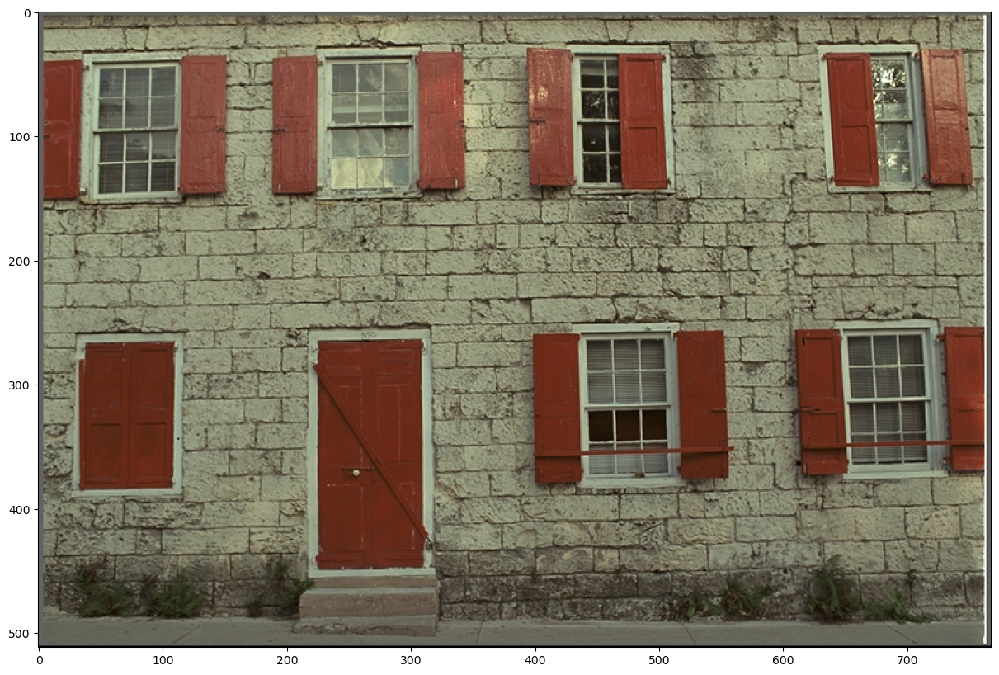

In [118]:
img = cv2.imread('kodim01.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

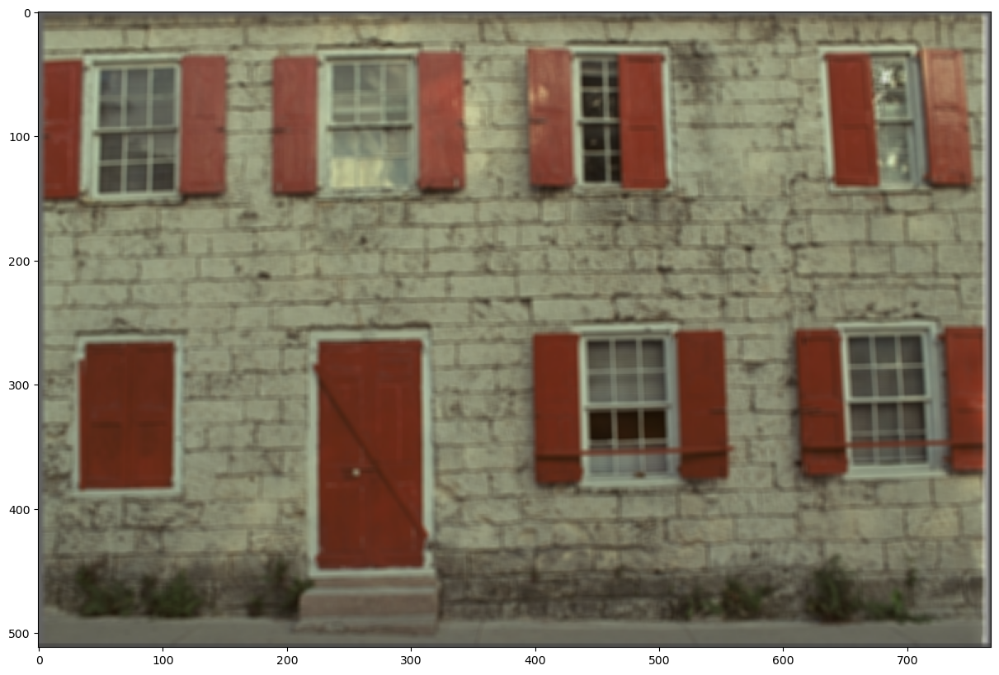

In [119]:
# Create a blurred (unsharp) version of the original image (you can use Gaussian blurring)
unsharp = cv2.GaussianBlur(img, ksize=(5,5), sigmaX=5)
plt.imshow(unsharp)

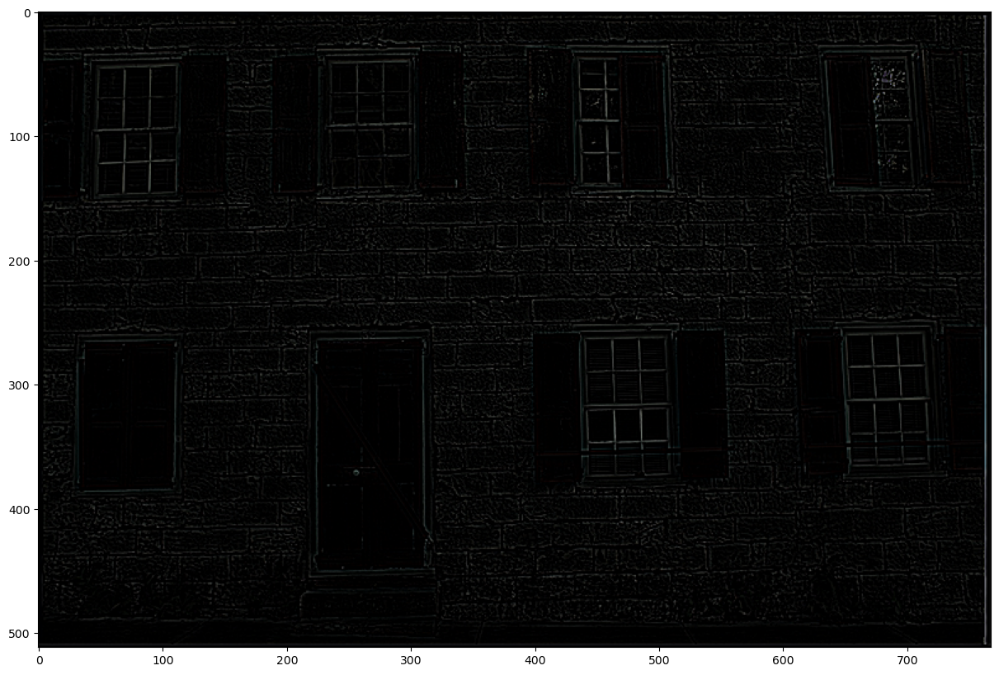

In [120]:
# Create the difference image (original − unsharp)
# Note: Remember that you are working with uint8 data types. Any addition or substractions
# might result in overflow or underflow, respectively. You can prevent this by casting the images to float.

img = img/255
unsharp = unsharp/255

diff = img - unsharp

diff_vis = np.clip(diff, 0.0, 1.0)

plt.imshow(diff_vis)

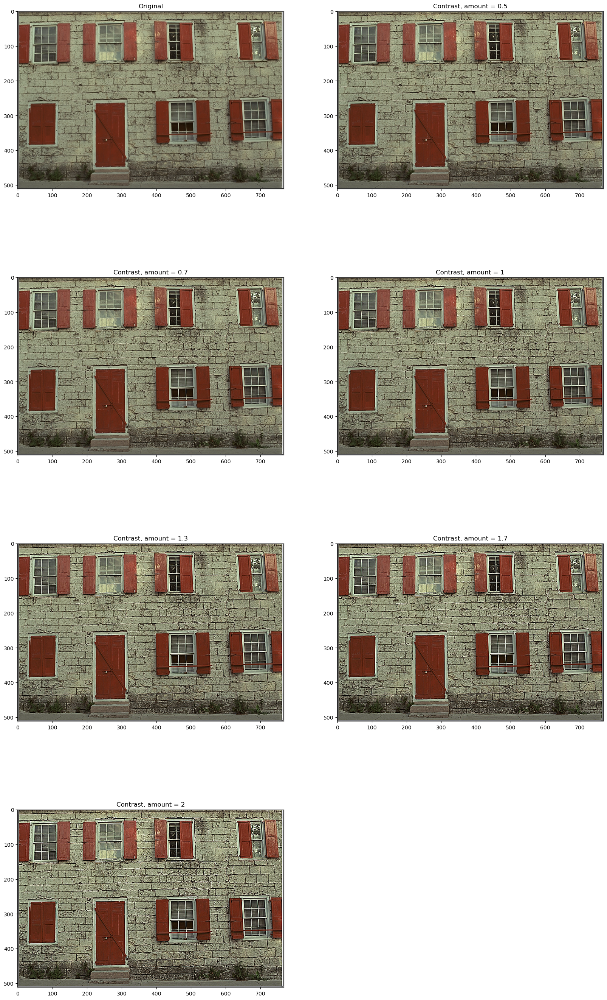

In [122]:
# Apply USM to get the resulting image using `sharpened = original + (original − unsharp) × amount`
# Note: Again, take care of underflows/overflows if necessary.

plt.figure(figsize=(20, 35))

amounts = [0.5, 0.7, 1, 1.3, 1.7, 2]
n = len(amounts)//2 + 1

i = 1
plt.subplot(n,2,i), plt.imshow(img), plt.title('Original'), plt.grid(False)


for amount in amounts:
    sharpened = img + diff * amount

    sharpened[sharpened > 1] = 1
    sharpened[sharpened < 0] = 0
    i += 1
  
    plt.subplot(n, 2, i), plt.imshow(sharpened), plt.title('Contrast, amount = ' + str(amount)), plt.grid(False)
    




In [ ]:
What is a good (reasonable) value for the amount parameter?
- На мою субєктивну думку найкраще поліпшення чіткості, коли amount дорівнює десь 1 - 1.3

What happens if it is too small?

- Якщо amount дуже маленький, то картинка залишається нечіткою

What happens if it is too large?

- Якщо amount завеликий, то разом з чіткістю суттєво збільшується наявність шумів